In [1]:
import pandas as pd 
import os
from tqdm import tqdm
from h3 import h3


data_path = '/Users/tanaybhardwaj/Downloads/yellow_tripdata_2016-04.csv'


df_tmp = pd.read_csv(data_path, nrows=5)
print(df_tmp.head())

#convert the locations to float32 and datetime to str
datatypes = {'tpep_pickup_datetime': 'str', 
              'pickup_longitude': 'float32',
              'pickup_latitude': 'float32'}


colums = list(datatypes.keys())

# The code will read 5 million rows at one go
chunksize = 5000000 

# list to hold the batch dataframe
df_list = [] 

for df_chunk in tqdm(pd.read_csv(data_path,  dtype=datatypes, chunksize=chunksize,usecols=colums)):       
    
    # Alternatively, append the chunk to list and merge all
    df_list.append(df_chunk)

0it [00:00, ?it/s]

   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0         1  2016-04-01 00:00:00   2016-04-01 00:01:59                1   
1         1  2016-04-01 00:00:00   2016-04-01 00:12:07                2   
2         2  2016-04-01 00:00:00   2016-04-01 00:10:41                2   
3         2  2016-04-01 00:00:00   2016-04-01 00:10:30                5   
4         2  2016-04-01 00:00:00   2016-04-01 00:00:00                2   

   trip_distance  pickup_longitude  pickup_latitude  RatecodeID  \
0           0.50        -73.976883        40.758495           1   
1           2.20        -73.985207        40.757294           1   
2           0.96        -73.979202        40.758869           1   
3           1.54        -73.984856        40.767723           1   
4          10.45        -73.863739        40.769470           1   

  store_and_fwd_flag  dropoff_longitude  dropoff_latitude  payment_type  \
0                  N         -73.977669         40.753902             2

3it [00:13,  4.57s/it]


In [2]:
taxi_df = pd.concat(df_list)

# Delete the dataframe list to release memory
del df_list

taxi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11934338 entries, 0 to 11934337
Data columns (total 3 columns):
tpep_pickup_datetime    object
pickup_longitude        float32
pickup_latitude         float32
dtypes: float32(2), object(1)
memory usage: 182.1+ MB


In [3]:
import matplotlib.pyplot as plt
taxi_df.columns = ['dt','lng','lat']
test = taxi_df.sample(frac=0.08, replace=False, random_state=1)
print(test)
test.plot(x='lng',y='lat',style='.',alpha=0.2,figsize=(12,12));
plt.title('Taxi Pickup Locations');

                           dt        lng        lat
7149661   2016-04-19 15:18:17 -73.975510  40.765423
2048629   2016-04-06 10:42:11 -73.993965  40.751179
1148122   2016-04-03 10:43:21 -73.790146  40.646755
7260760   2016-04-18 09:27:46 -73.991943  40.749680
2857202   2016-04-08 09:44:52 -73.966568  40.757401
...                       ...        ...        ...
9375183   2016-04-24 10:15:19 -73.983528  40.739105
10548021  2016-04-27 17:31:38 -73.873192  40.774033
11422870  2016-04-29 20:23:31 -73.783630  40.648636
2516021   2016-04-07 13:51:40 -73.976822  40.780060
3727750   2016-04-10 04:28:52 -74.003334  40.751591

[954747 rows x 3 columns]


/Users/tanaybhardwaj/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


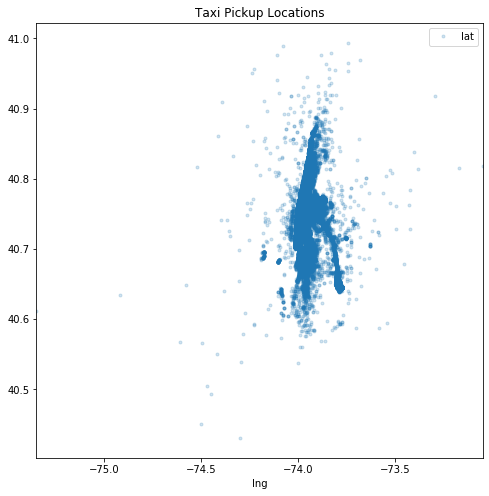

In [4]:
test = test[taxi_df.lat>40.4]
test = test[test.lat<41]
test.plot(x='lng',y='lat',style='.',alpha=0.2,figsize=(8,8));
plt.title('Taxi Pickup Locations');

In [11]:
import folium

In [13]:
import folium as cm
import geojson
from geojson import Feature, FeatureCollection, GeoJSON

In [14]:
import json

In [17]:


def counts_by_hexagon(df, resolution):
    
    """
    Use h3.geo_to_h3 to index each data point into the spatial index of the specified resolution.
    Use h3.h3_to_geo_boundary to obtain the geometries of these hexagons
    
    Ex counts_by_hexagon(data, 9)
    """
    
    df = df[["lat","lng"]]
    
    df["hex_id"] = df.apply(lambda row: h3.geo_to_h3(row["lat"], row["lng"], resolution), axis = 1)
    
    df_aggreg = df.groupby(by = "hex_id").size().reset_index()
    df_aggreg.columns = ["hex_id", "value"]
    
    df_aggreg["geometry"] =  df_aggreg.hex_id.apply(lambda x: 
                                                           {    "type" : "Polygon",
                                                                 "coordinates": 
                                                                [h3.h3_to_geo_boundary(h3_address=x,geo_json=True)]
                                                            }
                                                        )
    
    return df_aggreg

def hexagons_dataframe_to_geojson(df_hex, file_output = None):
    
    """
    Produce the GeoJSON for a dataframe that has a geometry column in geojson 
    format already, along with the columns hex_id and value
    
    Ex counts_by_hexagon(data)
    """    
    
    list_features = []
    
    for i,row in df_hex.iterrows():
        feature = Feature(geometry = row["geometry"] , id=row["hex_id"], properties = {"value" : row["value"]})
        list_features.append(feature)
        
    feat_collection = FeatureCollection(list_features)
    
    geojson_result = json.dumps(feat_collection)
    
    #optionally write to file
    if file_output is not None:
        with open(file_output,"w") as f:
            json.dump(feat_collection,f)
    
    return geojson_result


def choropleth_map(df_aggreg, border_color = 'black', fill_opacity = 0.7, initial_map = None, with_legend = False,
                   kind = "linear"):
    
    """
    Creates choropleth maps given the aggregated data.
    """    
    
    #colormap
    min_value = df_aggreg["value"].min()
    max_value = df_aggreg["value"].max()
    m = round ((min_value + max_value ) / 2 , 0)
    
    #take resolution from the first row
    res = h3.h3_get_resolution(df_aggreg.loc[0,'hex_id'])
    
    if initial_map is None:
        initial_map = folium.Map(location= [40.718728, -73.943802], zoom_start=12, tiles="cartodbpositron", 
                attr= '© <a href="http://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors © <a href="http://cartodb.com/attributions#basemaps">CartoDB</a>' 
            )
        

    #the colormap 
    #color names accepted https://github.com/python-visualization/branca/blob/master/branca/_cnames.json
    
    if kind == "linear":
        custom_cm = cm.LinearColormap(['green','yellow','red'], vmin=min_value, vmax=max_value)
    elif kind == "outlier":
        #for outliers, values would be -11,0,1
        custom_cm = cm.LinearColormap(['blue','white','red'], vmin=min_value, vmax=max_value)
    elif kind == "filled_nulls":
        custom_cm = cm.LinearColormap(['sienna','green','yellow','red'], 
                                      index=[0,min_value,m,max_value],vmin=min_value,vmax=max_value)
   

    #create geojson data from dataframe
    geojson_data = hexagons_dataframe_to_geojson(df_hex = df_aggreg)
    
    #plot on map
    name_layer = "Choropleth " + str(res)
    print(name_layer)
    if kind != "linear":
         name_layer = name_layer + kind
        
        
        
    cm.GeoJson(
        geojson_data,
        style_function=lambda feature: {
            'fillColor': custom_cm(feature['properties']['value']),
            'color': border_color,
            'weight': 1,
            'fillOpacity': fill_opacity 
        }, 
        name = name_layer
    ).add_to(initial_map)
    
    #add legend (not recommended if multiple layers)
    
    if with_legend == True:
        custom_cm.add_to(initial_map)
    
    
    return initial_map

def plot_scatter(df, metric_col, x='lng', y='lat', marker='.', alpha=1, figsize=(16,12), colormap='viridis'):
    """
    Scatter plot function for h3 indexed objects
    """    
    df.plot.scatter(x=x, y=y, c=metric_col, title=metric_col
                    , edgecolors='none', colormap=colormap, marker=marker, alpha=alpha, figsize=figsize);
    plt.xticks([], []); plt.yticks([], [])
    


In [18]:
df_aggreg = counts_by_hexagon(df = test, resolution = 9)
df_aggreg.sort_values(by = "value", ascending = False, inplace = True)

# Creates a map using Folium

hexmap = choropleth_map(df_aggreg = df_aggreg, with_legend = True)
hexmap

Choropleth 9


In [20]:

df_aggreg_11 = counts_by_hexagon(df = test, resolution = 11)
df_aggreg_9 = counts_by_hexagon(df = test, resolution = 9)
df_aggreg_8 = counts_by_hexagon(df = test, resolution = 8)
df_aggreg_7 = counts_by_hexagon(df = test, resolution = 7)
df_aggreg_6 = counts_by_hexagon(df = test, resolution =6)

hexmap11 = choropleth_map(df_aggreg = df_aggreg_11,with_legend = False)
hexmap9 = choropleth_map(df_aggreg = df_aggreg_9,initial_map = hexmap11, with_legend = False)
hexmap8 = choropleth_map(df_aggreg = df_aggreg_8, initial_map = hexmap9, with_legend = False)
hexmap7 = choropleth_map(df_aggreg = df_aggreg_7, initial_map = hexmap8 , with_legend = False)
hexmap6 = choropleth_map(df_aggreg = df_aggreg_6, initial_map = hexmap7, with_legend = False)

folium.map.LayerControl('bottomright', collapsed=False).add_to(hexmap6)

hexmap6.save('/Users/tanaybhardwaj/Desktop/Time Series Project/Uber/choropleth_multiple_res.html')
hexmap6

Choropleth 11
Choropleth 9
Choropleth 8
Choropleth 7
Choropleth 6
